In [5]:
import os
import pickle
from pathlib import Path
import pickle
import re
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import h5py
import scipy
from scipy import signal
from tqdm import tnrange
from tqdm import tqdm
import seaborn as sns

from scipy.stats import norm,entropy,linregress
from scipy.optimize import minimize, curve_fit
from scipy.io import savemat
from scipy.special import erf

#import multiprocess as mp
#from multiprocess import Pool
import sys
import warnings

from odor_breathing_functions import*
from functions_beh import*
from data_loader import*
from hdf5_loader_and_aux_functions import*


warnings.filterwarnings('ignore')

cmap = plt.rcParams['axes.prop_cycle'].by_key()['color']
modulename = 'multiprocess'
mpl.rcParams['svg.fonttype'] = 'none'
sns.set_context('poster', font_scale=1.1)

In [65]:
from pathlib import Path
import re
import pickle
import numpy as np
from typing import Dict, Any, List, Tuple, Optional

# ---------------------------
# CONFIG CLASS
# ---------------------------
class LoaderConfig:
    def __init__(
        self,
        root_dir: str = "Session", #folder in which the 'session_..._.pkl' files with the data from the behavioral session are.
        animals: Optional[List[str]] = None, #List of strings of the animal names you want to load
        date_range: Optional[Tuple[int, int]] = None,
        filters: Optional[Dict[str, Any]] = None,
        load_sniff: bool = True, #As of now, whether you want to get the histogram showing at which phase bin pulses arrived in each trial (sniff_histogram)
        load_breathing: bool = True, #Whether you want to load the breathing trace or not
        #load_autocorr: bool = True, #For incoproating later.
        verbose: bool = True,
        data_frame: bool = False
    ):
        self.root_dir = Path(root_dir)
        self.animals = animals  # e.g., ['Tabby', 'Banner']
        self.date_range = date_range  # (20190419, 20220526)
        self.filters = filters or {}  # ratio of lambdas, sampling window duration, performance, etc.
        self.load_sniff = load_sniff
        self.load_breathing = load_breathing
        #self.load_autocorr = load_autocorr #not for now, but can be added later.
        self.verbose = verbose
        self.data_frame = data_frame

def scan_session_metadata(file_path: Path) -> Dict[str, Any]:
    """Open a file just enough to read identifying and lightweight variables."""
    try:
        with open(file_path, "rb") as f:
            session_list = pickle.load(f)
            session = session_list[0]
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return {}
    
    year = session.get("year")
    month = session.get("month")
    day = session.get("day")
    animal_ = file_path.name[8:-18]

    # Deal with files without full date info
    if None in (year, month, day):
        year = int(file_path.name[-17:-13])
        month = str(file_path.name[-13:-11])
        day = str(file_path.name[-11:-9])
        meta = {
        "animal": str(animal_),  #session.get("animal"), we could also use this, but I prefer to use directly the filename because 
        # if the file was saved accidentally with a wrong animal ID, the session file won't have the corrected information even if the filename does
        "date": int(str(str(year)+month+day)),
        "session_num": session.get("session_id"),
        "num_trials": session.get("num_trials", 0),
        "type": session.get("type", None), #to select session with 'random' or 'block' trials
        "delay_time": session.get("delay_time", None), #duration of the sampling window
        "high_to_low_ratio": (round(session["high_count"]/session["low_count"])), #ratio between the lambda for the 'high' and 'low' trials. 
    }
        
    else:
        meta = {
        "animal": str(animal_),  #session.get("animal"), we could also use this, but I prefer to use directly the filename because 
        # if the file was saved accidentally with a wrong animal ID, the session file won't have the corrected information even if the filename does
        "date": int(f"{session.get('year'):04d}{session.get('month'):02d}{session.get('day'):02d}"),
        "session_num": session.get("session_id"),
        "num_trials": session.get("num_trials", 0),
        "type": session.get("type", None), #to select session with 'random' or 'block' trials
        "delay_time": session.get("delay_time", None), #duration of the sampling window
        "high_to_low_ratio": (round(session["high_count"]/session["low_count"])), #ratio between the lambda for the 'high' and 'low' trials. 
    }
    return meta

def passes_filters(meta: Dict[str, Any], config: LoaderConfig) -> bool: #Function for passing the filters to select which sessions to load.
    """Check both file-level and metadata-level filters."""
    if not meta:
        return False

    # Filter by animal
    if config.animals and meta["animal"] not in config.animals:
        return False

    # Filter by date range
    if config.date_range:
        start, end = config.date_range
        if not (start <= meta["date"] <= end):
            return False

    ntrials_min = config.filters.get("n_trials_min")
    if ntrials_min and meta["num_trials"] < ntrials_min:
        return False

    # Example of experiment-type filter
    if config.filters.get("type") and meta["type"] != config.filters["type"]:
        return False

    if config.filters.get("delay_time") and meta["delay_time"] != config.filters["delay_time"]:
        return False

    if config.filters.get("high_to_low_ratio") and meta["high_to_low_ratio"] != config.filters["high_to_low_ratio"]:
        return False

    return True

# ---------------------------
# FILE PARSING HELPERS
# ---------------------------
def parse_session_filename(filename: str):
    """
    Parse filenames like:
    session_MouseName_20231011_0.pickle
    Returns: (animal, date, session_num)
    """
    pattern = r"session_([A-Za-z0-9]+)_(\d{8})_(\d+)\.pickle"
    m = re.match(pattern, filename)
    if not m:
        raise ValueError(f"Filename {filename} does not match expected pattern.")
    animal, date, session_num = m.groups()
    return animal, date, int(session_num)

# ---------------------------
# SESSION LOADER
# ---------------------------
def load_session_file(file_path: Path, config: LoaderConfig) -> Optional[Dict[str, Any]]:
    """Fully load one session file and compute all desired variables."""
    try:
        with open(file_path, "rb") as f:
            session_list = pickle.load(f)
            session = session_list[0]
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None

    # Define non-idle trials
    non_idle_trials = np.invert(session["idle_trials"])
    #non_early_trials = np.invert(session['early_trials'])
    valid_trials = non_idle_trials #& non_early_trials
    high_trials = session['high_trials'][valid_trials]
    trial_odor = session['trial_odor'][valid_trials]
    cum_odor = np.ceil(trial_odor.sum(axis=1)/(session['pulse_time_ms']*100)) #session['level1'] can be used for newer versions

    # This is only for Bengal, SHorthair, Tabby (and maybe Banner) since the code for exporting session files did not account for early trials, 
    # and early trials would be considered non_idle but w random assignment  of high/low

    high_seven = cum_odor>8
    low_eight = cum_odor<=8
    all_low_trials = np.invert(high_trials.astype(np.bool))
    bad_trials_1 = np.logical_and(high_seven,all_low_trials)
    bad_trials_2 = np.logical_and(low_eight,high_trials)
    bad_trials = np.logical_or(bad_trials_1,bad_trials_2)
    good_trials = np.invert(bad_trials) #This would be a convoluted way of filtering 'early' trials.
    
    data = {
        "date": str(file_path.name[-17:-9]),
        "num_trials": session["num_trials"],
        "sampling_window": session['delay_time']*1000, #in ms
        "type": session['type'], #random or block
        "ratio": np.round(session['high_count']/session['low_count']),
        "good_trials": good_trials,
        "correct_trials": session["correct_trials"][valid_trials][good_trials],
        "high_trials": session["high_trials"][valid_trials][good_trials],
        "low_trials": session["low_trials"][valid_trials][good_trials],
        "high_choices": (session["correct_trials"][valid_trials][good_trials]==session["high_trials"][valid_trials][good_trials]),
        "trial_odor": trial_odor[good_trials],
        "cum_odor": cum_odor[good_trials]
    }
    if config.load_sniff:
        #shh = get_sniff_histogram(session, False)

        data["sniff_hist"] = get_sniff_histogram_beta(session, False)[valid_trials][good_trials]
        data["sniff_hist_shuffled"] = get_sniff_histogram_beta(session, True)[valid_trials][good_trials]

    if config.load_breathing:
        data["breathing"] = np.append(session['trial_pre_breath'][valid_trials, -2500:][good_trials], session['trial_breath'][valid_trials, :6500][good_trials], axis=1)

    # if config.load_spikes:
    #     data["spikes"] = load_spike_data(session_data)

    return data

def load_session_file_df(file_path: Path, config) -> Optional[pd.DataFrame]:
    """Fully load one session file and return a DataFrame with one row per trial."""
    try:
        with open(file_path, "rb") as f:
            session_list = pickle.load(f)
            session = session_list[0]
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None

    # Define non-idle trials
    non_idle_trials = np.invert(session["idle_trials"])
    valid_trials = non_idle_trials
    sampling_window = int(session['delay_time']*1000)
    high_trials = session['high_trials'][valid_trials]
    trial_odor = session['trial_odor'][:,:sampling_window][valid_trials]
    cum_odor = np.ceil(trial_odor.sum(axis=1)/(session['pulse_time_ms']*100))

    high_seven = cum_odor > 8
    low_eight = cum_odor <= 8
    all_low_trials = np.invert(high_trials.astype(np.bool_))
    bad_trials_1 = np.logical_and(high_seven, all_low_trials)
    bad_trials_2 = np.logical_and(low_eight, high_trials)
    bad_trials = np.logical_or(bad_trials_1, bad_trials_2)
    good_trials = np.invert(bad_trials)

    # Per-trial fields
    correct_trials = session["correct_trials"][valid_trials][good_trials]
    high_trials_f = session["high_trials"][valid_trials][good_trials]
    low_trials_f = session["low_trials"][valid_trials][good_trials]
    high_choices = correct_trials == high_trials_f
    trial_odor_f = trial_odor[good_trials]
    cum_odor_f = cum_odor[good_trials]

    n_trials = len(good_trials[good_trials])

    data_dict = {
        "date": [str(file_path.name[-17:-9])] * n_trials,
        "num_trials": n_trials,
        "trial": np.arange(n_trials),
        "sampling_window": sampling_window,
        "type": [session['type']] * n_trials,
        "ratio": [np.round(session['high_count']/session['low_count'])] * n_trials,
        "trial_odor" : list(trial_odor_f),
        "cum_odor": cum_odor_f,
        "correct_trial": correct_trials,
        "high_trial": high_trials_f,
        "low_trial": low_trials_f,
        "high_choice": high_choices,
    }

    if config.load_sniff:
        sniff_hist = get_sniff_histogram_beta(session, False)[valid_trials][good_trials]
        sniff_hist_shuffled = get_sniff_histogram_beta(session, True)[valid_trials][good_trials]
        #for i in range(sniff_hist.shape[1]):
        data_dict["sniff_hist"] = list(sniff_hist)
        data_dict["sniff_hist_shuffled"] = list(sniff_hist_shuffled)

    if config.load_breathing:
        pre_breathing = session['trial_pre_breath'][valid_trials][good_trials]
        breathing = session['trial_breath'][valid_trials][good_trials]
        data_dict['pre_breathing'] = list(pre_breathing)
        data_dict['breathing'] = list(breathing)
        
        data_dict['go_window_duration'] = (breathing.shape[1]-sampling_window)

    df = pd.DataFrame(data_dict)
    return df

# ---------------------------
# MAIN LOADER
# ---------------------------
def run_loader(config: LoaderConfig) -> Dict[str, Dict[str, Dict[str, Any]]]:
    """Load all session files passing the pre-filters."""
    all_data = {}
    all_data_df = []

    for file_path in config.root_dir.glob("session_*.pickle"):
        meta = scan_session_metadata(file_path)

        if not passes_filters(meta, config):
            continue

        animal = meta["animal"]
        date = str(meta["date"])
        session_num = str(meta["session_num"])

        if config.verbose:
            print(f"Loading: {animal} | {date} | session {session_num}")

        if config.data_frame == True:
            
            session_data = load_session_file_df(file_path, config)
            if session_data is None:
                continue
            all_data_df.append(session_data)

        else:
            session_data = load_session_file(file_path, config)
            if session_data is None:
                continue
            all_data.setdefault(animal, {}).setdefault(date, {})[session_num] = session_data

    if config.data_frame == True:
        return pd.concat(all_data_df, ignore_index=True) 
    
    else:
        return all_data

In [66]:
config = LoaderConfig(
    root_dir=os.getcwd()+"/Session/",
    animals=['Tabby'],#, 'Bengal', 'Shorthair', 'Banner', 'Natasha', 'Stark', 'Peterparker'],
    date_range=(20190423,20220427),
    load_sniff=True,
    #load_spikes=False,
    load_breathing=True,
    filters={
        "type":'random',
        "delay_time": 5,
        "high_to_low_ratio": 3},
    data_frame= True
)
print(config.root_dir)
all_data = run_loader(config)

/Users/boero/OEA_Data_Analysis/Session
Loading: Tabby | 20190423 | session 0
Loading: Tabby | 20190514 | session 0
Loading: Tabby | 20190503 | session 0
Loading: Tabby | 20190504 | session 0
Loading: Tabby | 20190505 | session 0
Loading: Tabby | 20190519 | session 0
Loading: Tabby | 20190518 | session 0
Loading: Tabby | 20190513 | session 0
Loading: Tabby | 20190512 | session 0
Loading: Tabby | 20190501 | session 0
Loading: Tabby | 20190517 | session 0
Loading: Tabby | 20190516 | session 0
Loading: Tabby | 20190426 | session 0
Loading: Tabby | 20190427 | session 0
Loading: Tabby | 20190510 | session 0
Loading: Tabby | 20190511 | session 0
Loading: Tabby | 20190430 | session 0


In [67]:
all_data

,date,num_trials,trial,sampling_window,type,ratio,trial_odor,cum_odor,correct_trial,high_trial,low_trial,high_choice,sniff_hist,sniff_hist_shuffled,pre_breathing,breathing,go_window_duration
0,20190423,169,0,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.0,False,False,True,True,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, ...","[1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...","[6.691799185088108, 6.699266100731649, 6.70153...","[6.874251755243092, 6.850227738178127, 6.76971...",2500
1,20190423,169,1,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",11.0,True,True,False,True,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 2.0, 1.0, ...","[0.0, 0.0, 1.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...","[1.9880253627484574, 2.198068547849992, 2.3915...","[5.865246341877236, 5.847390769908219, 5.73084...",2500
2,20190423,169,2,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.0,True,False,True,False,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[6.026595870473114, 6.026595870473114, 5.99185...","[7.402131874548258, 7.386224018241373, 7.23818...",2500
3,20190423,169,3,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.0,False,False,True,True,"[0.0, 0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...","[6.318778525952962, 6.385980613594424, 6.46292...","[6.5684328073408595, 6.479154571221061, 6.1980...",2500
4,20190423,169,4,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",13.0,False,True,False,False,"[0.0, 0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 0.0, 0.0, ...","[2.0, 1.0, 1.0, 2.0, 0.0, 1.0, 2.0, 1.0, 1.0, ...","[0.8865174162366811, 0.8348994919210913, 0.786...","[6.3450749915497955, 6.338257388929399, 5.5217...",2500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4203,20190430,321,316,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.0,True,False,True,False,"[1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, ...","[6.834644594123212, 6.543434895886061, 6.25677...","[0.47974227032646183, 0.47682050202242154, 1.5...",2500
4204,20190430,321,317,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",11.0,False,True,False,False,"[1.0, 1.0, 3.0, 1.0, 0.0, 0.0, 4.0, 0.0, 0.0, ...","[2.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 1.0, 3.0, ...","[8.687103703082125, 8.699115884759774, 8.72249...","[8.530620802654294, 8.547178111952144, 8.58224...",2500
4205,20190430,321,318,5000,random,3.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",13.0,False,True,False,False,"[0.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, ...","[0.3998806054335177, 0.39760811909501376, 0.39...","[5.995754399027676, 5.757788291963297, 4.81079...",2500
4206,20190430,321,319,5000,random,3.0,"[0.0, 0.0, 100.0, 100.0, 100.0, 100.0, 100.0, ...",14.0,False,True,False,False,"[1.0, 1.0, 1.0, 0.0, 1.0, 3.0, 0.0, 1.0, 2.0, ...","[0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 2.0, 0.0, 2.0, ...","[8.446535680018371, 8.419914147997053, 8.40790...","[1.9889992876428968, 1.8685572578184302, 1.517...",2500


In [58]:
print(len((all_data['pre_breathing'][2])))

2500


In [21]:
def pool_variables(all_data, var_names, by_animal=True):
    """
    Pools specified variables from a nested dictionary structure:
    all_data[animal][date][session_num][var_name]

    Parameters
    ----------
    all_data : dict
        Nested dictionary of the form {animal: {date: {session_num: data_dict}}}
    var_names : list of str
        Variables to pool across sessions.
    by_animal : bool, optional
        If True, returns data pooled separately per animal.
        If False, returns all data pooled together.

    Returns
    -------
    pooled : dict
        Dictionary with pooled arrays per variable (and per animal if by_animal=True).
    """
    pooled = {v: {} if by_animal else [] for v in var_names}

    for var in var_names:
        for animal, date_dict in all_data.items():
            vals = []

            for date, sessions in date_dict.items():
                for session_num, data in sessions.items():
                    if var in data and data[var] is not None:
                        vals.append(np.asarray(data[var]))

            if not vals:
                continue

            if by_animal:
                pooled[var][animal] = np.concatenate(vals)
            else:
                # If pooling across all animals
                pooled[var].extend(vals)

        # After all animals, concatenate if not by_animal
        if not by_animal and pooled[var]:
            pooled[var] = np.concatenate(pooled[var])

    return pooled

In [69]:
import numpy as np

def convert_pooled_to_array(all_data, var_name, by_animal=True, fill_value=np.nan):
    """
    Convert nested all_data dict to a numpy array pooling a specific variable across sessions.

    Structure expected:
    all_data[animal][date][session_num][var_name] = array-like

    Parameters
    ----------
    all_data : dict
        Nested dictionary of structure {animal: {date: {session_num: data_dict}}}
    var_name : str
        Variable name to extract and pool (e.g., 'sniff_hist')
    by_animal : bool, optional
        If True, returns a 3D array (animal x trials x features)
        If False, returns a 2D array (trials x features)
    fill_value : float, optional
        Value used to pad when trial counts differ between animals (default: np.nan)

    Returns
    -------
    pooled : np.ndarray
        2D (if by_animal=False) or 3D (if by_animal=True) numpy array with pooled data.
    animal_order : list
        List of animal keys corresponding to the first axis (if by_animal=True).
    """
    # ---- Helper to extract one variable for one animal ----
    def extract_animal_data(animal_dict, var_name):
        vals = []
        for date, sessions in animal_dict.items():
            for session_num, data in sessions.items():
                if var_name in data and data[var_name] is not None:
                    vals.append(np.asarray(data[var_name]))
        return np.concatenate(vals, axis=0) if vals else np.empty((0,))

    animals = list(all_data.keys())

    if by_animal:
        pooled_per_animal = []
        max_trials = 0
        feature_dim = None

        # Collect data per animal
        for animal in animals:
            arr = extract_animal_data(all_data[animal], var_name)
            if arr.ndim == 1:
                arr = arr[:, np.newaxis]
            pooled_per_animal.append(arr)
            max_trials = max(max_trials, arr.shape[0])
            feature_dim = arr.shape[1]

        # Pad to make equal trial counts
        pooled = np.full((len(animals), max_trials, feature_dim), fill_value)
        for i, arr in enumerate(pooled_per_animal):
            pooled[i, :arr.shape[0], :] = arr

        return pooled, animals

    else:
        # Pool across all animals
        all_vals = []
        for animal in animals:
            arr = extract_animal_data(all_data[animal], var_name)
            if arr.ndim == 1:
                arr = arr[:, np.newaxis]
            all_vals.append(arr)

        if all_vals:
            pooled = np.concatenate(all_vals, axis=0)
        else:
            pooled = np.empty((0,))

        return pooled, None


In [22]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from tqdm import trange

def run_bootstrap_logistic(all_data, required_vars=("cum_odor", "sniff_hist", "high_choices"),
                           N_bootstrap=15000, num_iter=1000, by_animal=False,
                           random_seed=None, progress=False):
    """
    Runs logistic regression with bootstrap sampling on pooled session data.

    Parameters
    ----------
    all_data : dict
        Nested dictionary {animal: {date: {session_num: data_dict}}}
    required_vars : tuple of str
        Names of variables to pool: (odor, sniff_hist, target)
    N_bootstrap : int
        Number of bootstrap samples per iteration
    num_iter : int
        Number of iterations
    by_animal : bool
        Whether to pool separately by animal
    random_seed : int
        Seed for reproducibility
    progress : bool
        Whether to show progress with tqdm

    Returns
    -------
    results : dict
        Keys are variable names (or animal names if by_animal=True) and values are lists of iteration outputs.
    """
    import numpy as np
    from sklearn.linear_model import LogisticRegression
    from tqdm import trange

    if random_seed is not None:
        np.random.seed(random_seed)

    # First, pool all required variables
    pooled = pool_variables(all_data, list(required_vars), by_animal=by_animal)

    # Ensure non-empty arrays
    for v in pooled:
        if isinstance(pooled[v], list):
            if len(pooled[v]) == 0:
                raise ValueError(f"No data found for variable '{v}'. Check that all sessions include it.")
            pooled[v] = np.concatenate(pooled[v])

    results = {}

    # Decide keys to iterate over
    keys_to_loop = pooled[required_vars[0]].keys() if by_animal else ["all"]

    # Worker function for bootstrap
    def worker(X_odor, X_sniff, y):
        idx = np.random.randint(0, len(y), size=N_bootstrap)
        X1 = X_odor[idx].reshape(-1, 1)
        X2 = X_sniff[idx]
        y_bs = y[idx].astype(int)
        clf1 = LogisticRegression().fit(X1, y_bs)
        clf2 = LogisticRegression().fit(X2, y_bs)
        acc = [clf1.score(X1, y_bs) * 100, clf2.score(X2, y_bs) * 100]
        weights = clf2.coef_[0][0:15]/clf2.coef_[0][0:15].max()
        return acc, weights

    # Main loop
    for key in keys_to_loop:
        if by_animal:
            X_odor = pooled[required_vars[0]][key]
            X_sniff = pooled[required_vars[1]][key]
            y = pooled[required_vars[2]][key].astype(int)
        else:
            X_odor = pooled[required_vars[0]]
            X_sniff = pooled[required_vars[1]]
            y = pooled[required_vars[2]].astype(int)

        n_trials = X_odor.shape[0]
        if X_sniff.ndim == 1:
            X_sniff = X_sniff.reshape(n_trials, -1)

        iterations = trange(num_iter) if progress else range(num_iter)
        output = [worker(X_odor, X_sniff, y) for _ in iterations]
        results[key] = output

    return results

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.errorbar(range(16), res_2['mean'],
             yerr=[res['mean']-res['ci_low'], res['ci_high']-res['mean']],
             fmt='-o', capsize=3)
plt.xlabel('Sniff bin')
plt.ylabel('Weight')
plt.title('Bootstrapped Logistic Regression Weights')
plt.show()

In [6]:
# sniff_hist_pooled, animals = convert_pooled_to_array(all_data, "sniff_hist", by_animal=True)
# print(sniff_hist_pooled[2].shape)  # (n_animals, max_trials, 15)

cum_odor_all, _ = convert_pooled_to_array(all_data, "cum_odor", by_animal=False)
sniff_hist_all, _ = convert_pooled_to_array(all_data, "sniff_hist", by_animal=False)
sniff_hist_sh_all, _ = convert_pooled_to_array(all_data, "sniff_hist_shuffled", by_animal=False)
high_choices_all, _ = convert_pooled_to_array(all_data, "high_choices", by_animal=False)

selected_trials = np.logical_and(cum_odor_all>0,cum_odor_all<21).squeeze()
cum_odor_selected = cum_odor_all[selected_trials]
sniff_hist_selected = sniff_hist_all[selected_trials,:]
high_choices_selected = high_choices_all[selected_trials]
sniff_hist_sh_selected = sniff_hist_sh_all[selected_trials]


In [8]:
def bootstrap_worker(X, y, random_state=None):
    rng = np.random.default_rng(random_state)
    idx = rng.choice(len(y), len(y), replace=True)
    Xb, yb = X[idx], y[idx]

    model = LogisticRegression(solver='lbfgs', max_iter=1000)
    model.fit(Xb, yb)
    weights = model.coef_[0][:len(Xb)]/model.coef_[0][:len(Xb)].max()
    return weights.ravel()


def bs_logistic(
    X,
    y,
    N_bootstrap=15000,
    n_jobs=-1,
    random_seed=None,
):
    rng = np.random.default_rng(random_seed)
    seeds = rng.integers(0, 1e6, size=N_bootstrap)

    results = Parallel(n_jobs=n_jobs)(
        delayed(bootstrap_worker)(X, y, random_state=s)
        for s in seeds
    )

    all_coefs = np.vstack(results)
    mean_coefs = all_coefs.mean(axis=0)
    std_coefs = all_coefs.std(axis=0)
    ci_low = np.percentile(all_coefs, 2.5, axis=0)
    ci_high = np.percentile(all_coefs, 97.5, axis=0)

    return {
        'all_coefs': all_coefs,
        'mean': mean_coefs,
        'std_coefs': std_coefs,
        'ci_low': ci_low,
        'ci_high': ci_high,
    }

In [97]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from joblib import Parallel, delayed

def bootstrap_worker_fast(X, y, random_state=None):
    rng = np.random.default_rng(random_state)
    idx = rng.choice(len(y), len(y), replace=True)
    Xb, yb = X[idx], y[idx]

    model = LogisticRegression(solver='lbfgs', max_iter=1000)
    model.fit(Xb, yb)
    weights = model.coef_[0][:len(Xb)]/model.coef_[0][:len(Xb)].max()
    return weights.ravel()


def run_bootstrap_logistic_from_arrays_fast(
    X,
    y,
    N_bootstrap=15000,
    n_jobs=-1,
    random_seed=None,
):
    rng = np.random.default_rng(random_seed)
    seeds = rng.integers(0, 1e6, size=N_bootstrap)

    results = Parallel(n_jobs=n_jobs)(
        delayed(bootstrap_worker_fast)(X, y, random_state=s)
        for s in seeds
    )

    all_coefs = np.vstack(results)
    mean_coefs = all_coefs.mean(axis=0)
    std_coefs = all_coefs.std(axis=0)
    ci_low = np.percentile(all_coefs, 2.5, axis=0)
    ci_high = np.percentile(all_coefs, 97.5, axis=0)

    return {
        'all_coefs': all_coefs,
        'mean': mean_coefs,
        'std_coefs': std_coefs,
        'ci_low': ci_low,
        'ci_high': ci_high,
    }


In [11]:
from scipy.stats import norm,entropy,linregress
from scipy.optimize import minimize, curve_fit
from scipy.io import savemat
from scipy.special import erf
from sklearn.linear_model import LogisticRegression
from joblib import Parallel, delayed
res = bs_logistic(sniff_hist_all, high_choices_all, N_bootstrap=15000)
res_sh = bs_logistic(sniff_hist_sh_all, high_choices_all, N_bootstrap=15000)

/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataC

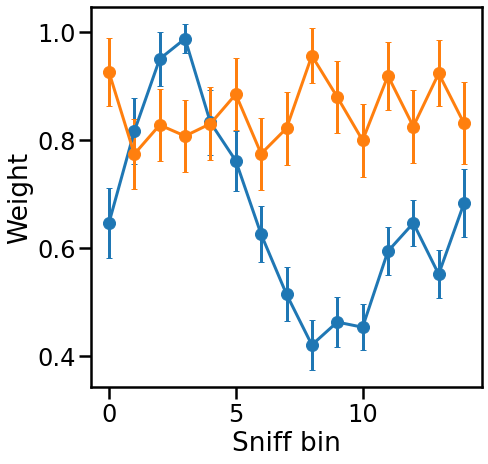

In [12]:
plt.figure(figsize=(7,7))
plt.errorbar(range(sniff_hist_all.shape[1]), res['mean'],
             yerr=res['std_coefs'],
             fmt='-o', capsize=3)
plt.errorbar(range(sniff_hist_sh_all.shape[1]), res_sh['mean'],
             yerr=res_sh['std_coefs'],
             fmt='-o', capsize=3)


plt.xlabel('Sniff bin')
plt.ylabel('Weight')
#plt.title('Bootstrapped Logistic Regression Weights')
plt.show()

In [14]:
weighted_odor = (sniff_hist_selected*res['mean']).sum(axis=1)
slope, intercept, r_value, p_value, std_err, intercept_stderr  =  linregress(cum_odor_selected.squeeze(), weighted_odor)
x_fit = np.linspace(1,20,20)
Y_pred_new = x_fit * slope + intercept

plt.figure(figsize=(6,7))
plt.scatter(cum_odor_selected, weighted_odor, marker='o', color='r', edgecolors='k', alpha=.8, clip_on=False)#, vert=False)
plt.plot(x_fit, Y_pred_new, c='k')
equation_text = f'Y = {slope:.2f}X + {intercept:.2f}'
plt.text(9.5,1,equation_text, size=20)
plt.xlabel('Delivered pulse count')
plt.ylabel('Effective pulse count')
plt.ylim(0,15)
plt.xlim(0,20)
sns.despine(offset=20)

ValueError: not enough values to unpack (expected 6, got 5)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.errorbar(range(sniff_hist_all.shape[1]), res['mean'],
             yerr=[res['mean']-res['ci_low'], res['ci_high']-res['mean']],
             fmt='-o', capsize=3)
plt.xlabel('Sniff bin')
plt.ylabel('Weight')
plt.title('Bootstrapped Logistic Regression Weights')
plt.show()

In [135]:
# Pool variables first (you already have pool_variables implemented)
pooled = pool_variables(all_data, ['cum_odor','sniff_hist','high_choices'], by_animal=False)

# Then run (this function will call pool_variables internally, but showing both options)
res = run_bootstrap_logistic(all_data,
                             required_vars=("cum_odor","sniff_hist","high_choices"),
                             N_bootstrap=15000,
                             num_iter=1000,
                             by_animal=False,
                             random_seed=None,
                             progress=True)

100%|██████████| 1000/1000 [00:19<00:00, 51.19it/s]


In [ ]:
from scipy.io import savemat

flat_dict = {}
for animal, sessions in all_data.items():
    for session_id, session_data in sessions.items():
        # Create a key like "MouseA_20231010_0_correct_trials"
        for var_name, value in session_data.items():
            key = f"{animal}_{session_id}_{var_name}"
            flat_dict[key] = value

#savemat("sessions_flat.mat", flat_dict)

In [7]:
def save_hdf5(filename, data):
    with h5py.File(filename, "w") as f:
        def recurse(h5group, d):
            for k, v in d.items():
                if isinstance(v, dict):
                    subgroup = h5group.create_group(k)
                    recurse(subgroup, v)
                else:
                    try:
                        h5group.create_dataset(k, data=np.array(v))
                    except Exception:
                        # store non-numeric data as string
                        h5group.create_dataset(k, data=str(v))
        recurse(f, data)

save_hdf5("sessions_kyrell.h5", all_data)

In [65]:
def load_hdf5(filename):
    def recurse(h5group):
        d = {}
        for key, item in h5group.items():
            if isinstance(item, h5py.Group):
                d[key] = recurse(item)
            else:
                data = item[()]
                # Decode bytes or convert arrays
                if isinstance(data, bytes):
                    data = data.decode('utf-8')
                elif isinstance(data, np.ndarray) and data.shape == ():
                    data = data.item()  # convert 0-D arrays to scalars
                d[key] = data
        return d

    with h5py.File(filename, "r") as f:
        return recurse(f)

# Example usage:
all_data_loaded = load_hdf5("sessions_kyrell.h5")

In [68]:
print(list(all_data_loaded.keys()))
list(all_data_loaded['Tabby'].keys())  # ['Session_01', 'Session_02', ...]

['Banner', 'Bengal', 'Natasha', 'Peterparker', 'Shorthair', 'Stark', 'Tabby']


['20190419',
 '20190423',
 '20190426',
 '20190427',
 '20190430',
 '20190501',
 '20190503',
 '20190504',
 '20190505',
 '20190510',
 '20190511',
 '20190512',
 '20190513',
 '20190514',
 '20190516',
 '20190517',
 '20190518',
 '20190519']

In [76]:
sniff_hist_pooled, animals = convert_pooled_to_array(all_data_loaded, "sniff_hist", by_animal=True)
print(sniff_hist_pooled[2].shape)  # (n_animals, max_trials, 15)

cum_odor_all, _ = convert_pooled_to_array(all_data_loaded, "cum_odor", by_animal=False)
sniff_hist_all, _ = convert_pooled_to_array(all_data_loaded, "sniff_hist", by_animal=False)
print(sniff_hist_all.shape)
high_choices_all, _ = convert_pooled_to_array(all_data_loaded, "high_choices", by_animal=False)

(5327, 15)
(20042, 15)


/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataC

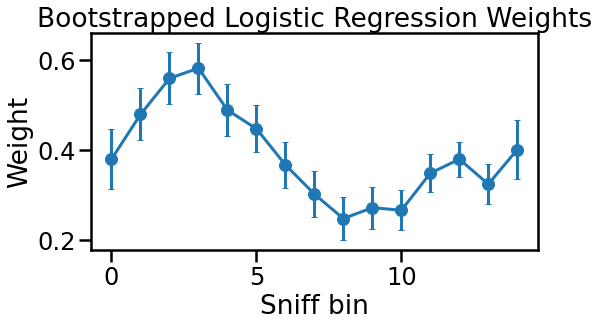

In [75]:
res = run_bootstrap_logistic_from_arrays_fast(sniff_hist_all, high_choices_all, N_bootstrap=15000)

import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.errorbar(range(sniff_hist_all.shape[1]), res['mean'],
             yerr=[res['mean']-res['ci_low'], res['ci_high']-res['mean']],
             fmt='-o', capsize=3)
plt.xlabel('Sniff bin')
plt.ylabel('Weight')
plt.title('Bootstrapped Logistic Regression Weights')
plt.show()

In [85]:
#cum_odor_all.squeeze().shape
selected_trials = np.logical_and(cum_odor_all>0,cum_odor_all<21).squeeze()

cum_odor_selected = cum_odor_all[selected_trials]
sniff_hist_selected = sniff_hist_all[selected_trials,:]
high_choices_selected = high_choices_all[selected_trials]

/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/boero/opt/anaconda3/envs/all_behavior/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataC

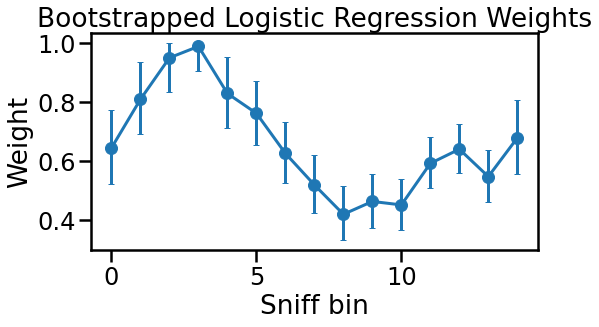

In [89]:
res = run_bootstrap_logistic_from_arrays_fast(sniff_hist_selected, high_choices_selected, N_bootstrap=15000)

import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.errorbar(range(sniff_hist_all.shape[1]), res['mean'],
             yerr=[res['mean']-res['ci_low'], res['ci_high']-res['mean']],
             fmt='-o', capsize=3)
plt.xlabel('Sniff bin')
plt.ylabel('Weight')
plt.title('Bootstrapped Logistic Regression Weights')
plt.show()